## Data preparation

In [1]:
import os
import tensorflow as tf
import cv2
from sklearn.model_selection import train_test_split
import numpy as np

dataset_path = "/kaggle/input/crack-segmentation-dataset/crack_segmentation_dataset"

train_path = os.path.join(dataset_path, "train/images")
test_path = os.path.join(dataset_path, "test/images")

train_image_paths = [os.path.join(train_path, fname) for fname in os.listdir(train_path)]
test_image_paths = [os.path.join(test_path, fname) for fname in os.listdir(test_path)]

train_labels = [0 if os.path.basename(path).startswith("noncrack") else 1 for path in train_image_paths]
test_labels = [0 if os.path.basename(path).startswith("noncrack") else 1 for path in test_image_paths]

train_files = list(zip(train_image_paths, train_labels))
test_files = list(zip(test_image_paths, test_labels))

train_data, val_data = train_test_split(train_files, test_size=0.2, random_state=42)

train_paths, train_labels = zip(*train_data)
val_paths, val_labels = zip(*val_data)
test_paths, test_labels = zip(*test_files) 

### Data Augmentation
To enhance the dataset, it seems reasonable to create some synthetic images. We do it by applying a random amount of 90 degree rotations, and then followed with optional (random 50/50 chance) horizontal and vertical flips. This way, we double the amount of training data, while maintaining high variability (no redundancy). Augmentation is applied to the training set only.

In [2]:
def preprocess(file_path, label):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (128, 128))
    img = tf.cast(img, tf.float32) / 255.0
    return img, label

def augment(image, label):
    image = tf.image.rot90(image, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)) # Random rotations
    image = tf.image.random_flip_left_right(image) # Random horizontal flip
    image = tf.image.random_flip_up_down(image) # Random vertical flip
    return image, label

original_train_ds = tf.data.Dataset.from_tensor_slices((list(train_paths), list(train_labels)))
original_train_ds = original_train_ds.map(preprocess)

augmented_train_ds = tf.data.Dataset.from_tensor_slices((list(train_paths), list(train_labels)))
augmented_train_ds = augmented_train_ds.map(preprocess).map(augment)

train_ds = original_train_ds.concatenate(augmented_train_ds).shuffle(buffer_size=200).batch(32)

val_ds = tf.data.Dataset.from_tensor_slices((list(val_paths), list(val_labels)))
val_ds = val_ds.map(preprocess).batch(32)

test_ds = tf.data.Dataset.from_tensor_slices((list(test_paths), list(test_labels)))
test_ds = test_ds.map(preprocess).batch(32)

## Inspect the dataset

### Check the images

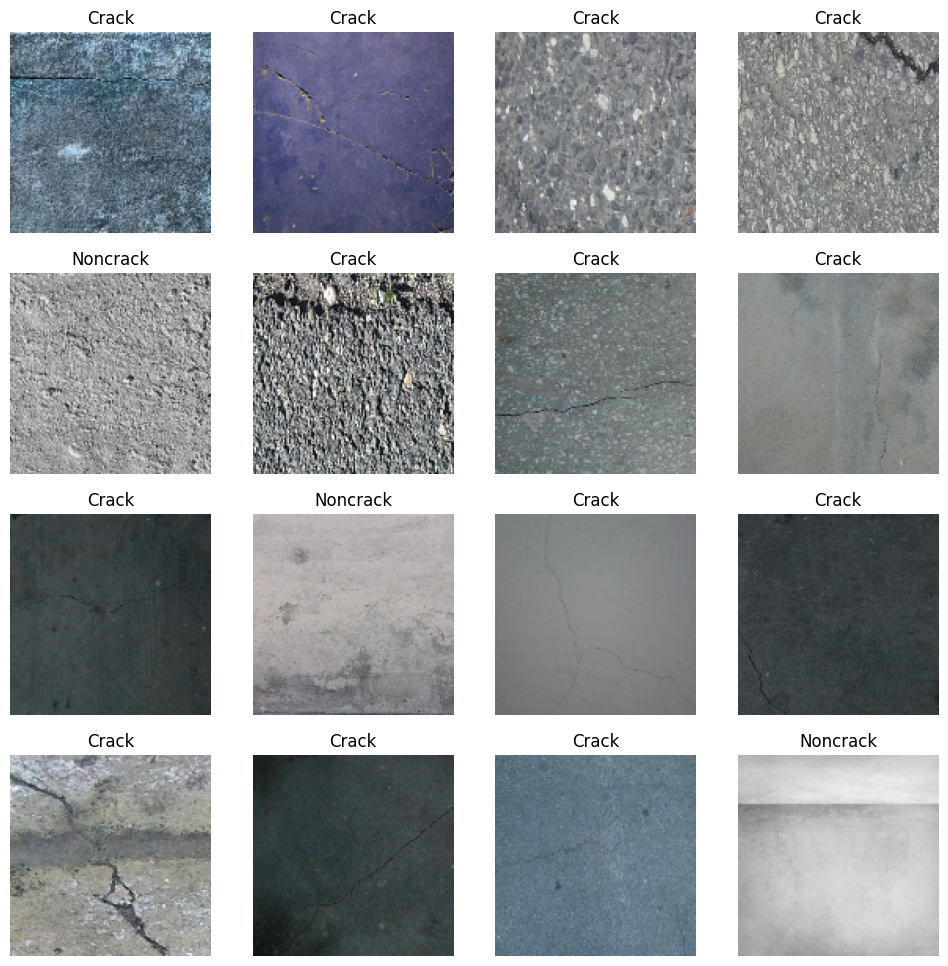

In [3]:
import matplotlib.pyplot as plt

for images, labels in train_ds.take(1):
    plt.figure(figsize=(12, 12))
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy())
        plt.title("Noncrack" if labels[i].numpy() == 0 else "Crack")
        plt.axis("off")


### Check for class imbalance

In [4]:
print("Percent of crack images in the training set:", '{0:.2f}'.format(sum(train_labels)/len(train_labels)*100))
print("Percent of non-crack images in the training set:", '{0:.2f}'.format(100-sum(train_labels)/len(train_labels)*100))

Percent of crack images in the training set: 87.61
Percent of non-crack images in the training set: 12.39


Considering the above, we can surely say that we have a problem with class imbalance. Roughly **7 out of 8 images** are depicting cracks. We need to take care of this, as it would bias the model into blind-guessing the majority class in most cases.

In [5]:
class_weights = {0: 8/1, 1: 8/7} # emphasize the weights of the minority class

## Testing models: Simple CNN, VGG-16, ResNet50
The initial step of our project would be to create a performant crack classifier. The function below handles creation of different models; custom CNN that we trained on the dataset exclusively and 2 pretrained ones that we fine-tuned. 

In [6]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models

def create_model(model_name, weights="imagenet", epochs=10):
    if model_name == "CNN":
        def create_classification_model():
            model = models.Sequential([
                layers.Conv2D(32, (3, 3), activation='relu'),
                layers.MaxPooling2D((2, 2)),
                layers.Conv2D(64, (3, 3), activation='relu'),
                layers.MaxPooling2D((2, 2)),
                layers.Conv2D(128, (3, 3), activation='relu'),
                layers.GlobalAveragePooling2D(),
                layers.Dense(64, activation='relu'),
                layers.Dense(1, activation='sigmoid')
            ])
            model.compile(optimizer='adam',
                          loss='binary_crossentropy',
                          metrics=['accuracy'])
            return model

        model = create_classification_model()
        history = model.fit(
            train_ds,
            validation_data=val_ds,
            epochs=epochs,
            class_weight=class_weights,
            verbose=0
        )
        print("Best accuracy achieved (on the training set):", max(history.history['accuracy']))
        print("Best loss achieved (on the training set):", min(history.history['loss']))
    elif model_name == "vgg16":
        base_model = VGG16(weights=weights, include_top=False, input_shape=(128, 128, 3))
        # Freeze the base model layers
        for layer in base_model.layers:
            layer.trainable = False
        
        # Add classification layers
        x = Flatten()(base_model.output)
        x = Dense(256, activation='relu')(x)
        output = Dense(1, activation='sigmoid')(x)
        
        model = Model(inputs=base_model.input, outputs=output)
        
        model.compile(optimizer=Adam(learning_rate=0.001),
                      loss='binary_crossentropy',
                      metrics=['accuracy'])
        history = model.fit(train_ds, 
            validation_data=val_ds, 
            epochs=epochs,
            class_weight=class_weights,
            verbose=0
        )
        print("Best accuracy achieved (on the training set):", max(history.history['accuracy']))
        print("Best loss achieved (on the training set):", min(history.history['loss']))
    elif model_name == "resnet":
        base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(128, 128, 3))
        
        for layer in base_model.layers:
            layer.trainable = False
        
        x = layers.GlobalAveragePooling2D()(base_model.output)
        x = Dense(256, activation='relu')(x)
        x = Dropout(0.5)(x)
        output = Dense(1, activation='sigmoid')(x)
        
        model = Model(inputs=base_model.input, outputs=output)
        
        model.compile(optimizer=Adam(learning_rate=0.001),
                      loss='binary_crossentropy',
                      metrics=['accuracy'])
        
        history = model.fit(train_ds, 
            validation_data=val_ds, 
            epochs=epochs,
            class_weight=class_weights,
            verbose=0
        )
        print("Best accuracy achieved (on the training set):", max(history.history['accuracy']))
        print("Best loss achieved (on the training set):", min(history.history['loss']))
        
    else:
        raise ValueError("Currently not supported!")

    return [model, history]

def visualize_predictions(model):
    num_images_per_row = 4
    fig, axes = plt.subplots(
        nrows=8,
        ncols=num_images_per_row,
        figsize=(20, 20)
    )
    fig.suptitle("Model's predictions on unseen data")
    
    for i, (images, labels) in enumerate(test_ds.take(1)):
        for j in range(min(len(images), num_images_per_row * 8)):
            image = images[j]
            label = labels[j].numpy()
            image_batch = tf.expand_dims(image, axis=0)
            predictions = model.predict(image_batch, verbose=0)
            
            ax = axes[j // num_images_per_row, j % num_images_per_row]
            ax.imshow(image)
            ax.set_title(f"Label: {label}\nPred: {predictions[0][0]:.2f}")
            ax.axis("off")
    
        break
    
    plt.tight_layout()
    plt.show()

### Simple CNN
Our CNN model is quite straightforward. It was trained on a relatively small number of epochs, however it has already managed to achieve quite remarkable results. Definitely sufficient for our usecase.

Best accuracy achieved (on the training set): 0.8980734348297119
Best loss achieved (on the training set): 0.5302064418792725


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 304,709 (1.16 MB)

 Trainable params: 101,569 (396.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 203,140 (793.52 KB)

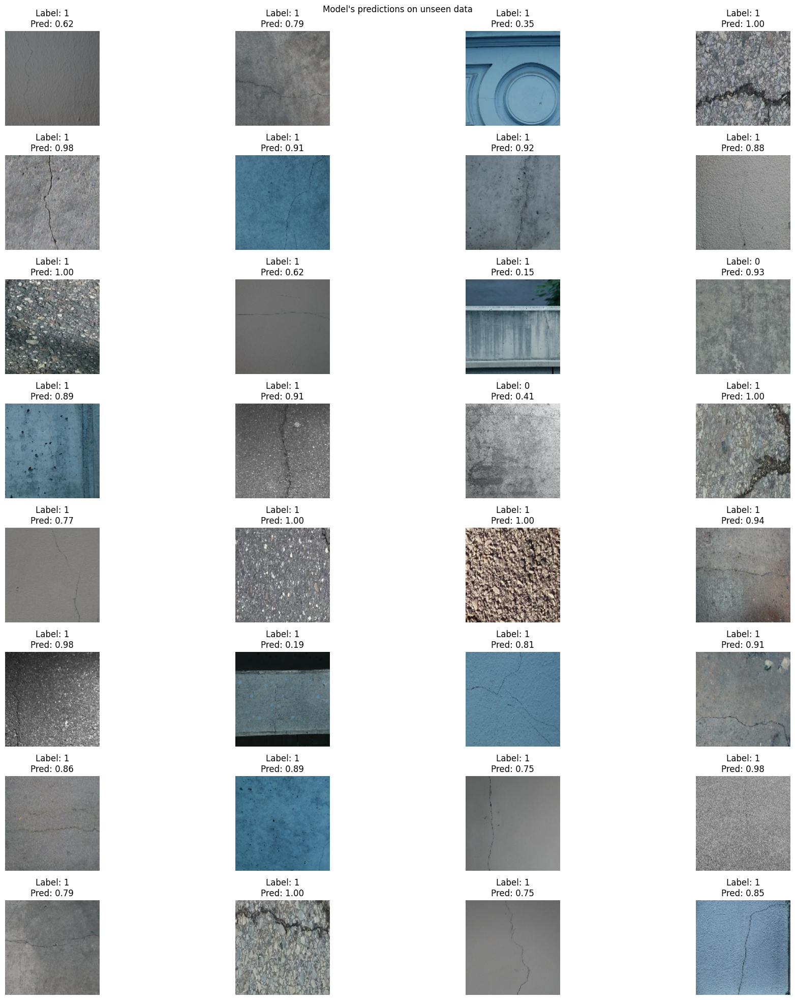

In [7]:
model, _ = create_model("CNN")
model.summary()
visualize_predictions(model)

### VGG-16
VGG-16 with a very basic fine-tuning (obtained by freezing the weight of base model and adding dense layer along with ReLU and sigmoid at output) is able to achieve an astounding performance after only few epochs of training. It might be said that VGG16 can detect subtle patterns like road cracks because its dense feature representation captures fine-grained textures. Its architecture, though simplistic by modern standards, works well for datasets where subtle, localized features dominate.

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Best accuracy achieved (on the training set): 0.9858109951019287
Best loss achieved (on the training set): 0.07523949444293976


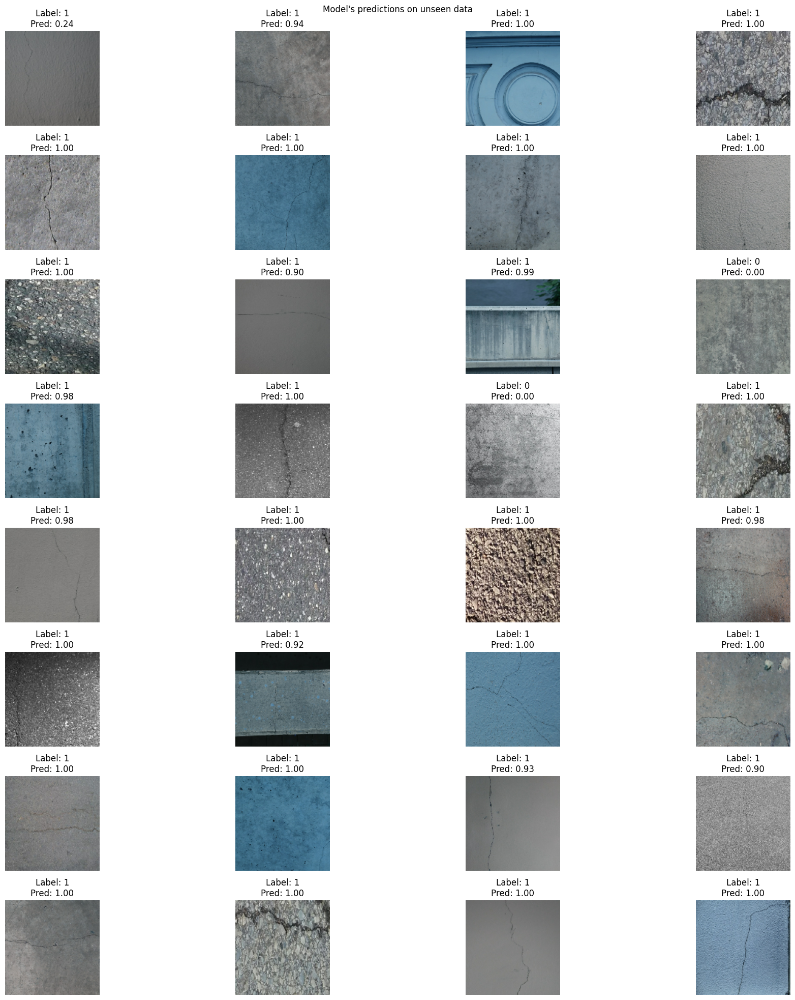

In [8]:
vgg16, _ = create_model("vgg16")
visualize_predictions(vgg16)

### ResNet
While the training accuracy in case of ResNet is not that bad, considering the small number of epochs, it is significantly worse than its predecessors, given the same training data and number of epochs (as well as non-base architecture: Dense + ReLU + Sigmoid classification). One reason for its inferior performance could be that skip connections can dilute the focus on subtle, localized features like cracks, while effective for large-scale object recognition.

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Best accuracy achieved (on the training set): 0.633558988571167
Best loss achieved (on the training set): 1.1069107055664062


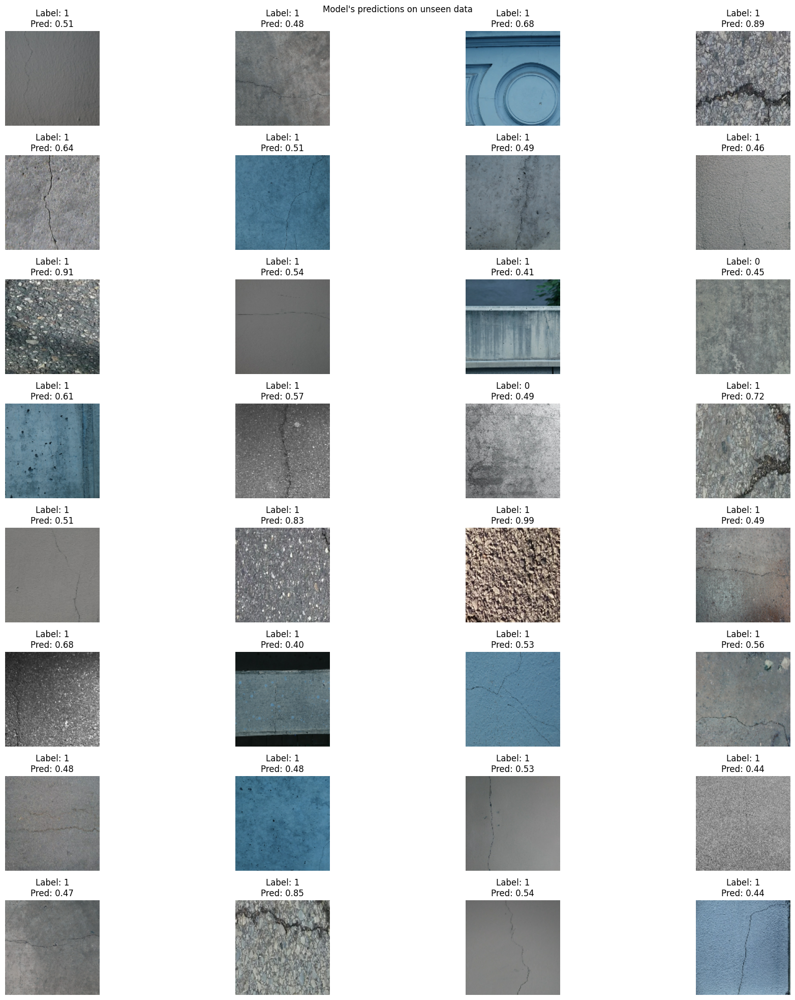

In [9]:
resnet, _ = create_model("resnet")
visualize_predictions(resnet)

### Conclusion:
We tested several different architectures and may conclude that VGG-16 vastly outperformed the other models. Nonetheless, we have to take into account that those models didn't converge yet, due to small number of epochs, and could easily be further enhanced. But that is not the point of this experiment. We need a trustworthy **CNN-based classifier** in order to extract its "knowledge" (will be explained in the next step) and visualize the parts of the picture that govern the prediction result - i.e. locations of cracks.

## Grad-CAM 
Gradient-weighted Class Activation Mapping (Grad-CAM), [relevant paper](https://doi.org/10.48550/arXiv.1610.02391)

### Short description of the algorithm
The Grad-CAM (Gradient-weighted Class Activation Mapping) algorithm is a visualization technique that helps interpret decisions made by deep convolutional neural networks (CNNs). It does so by producing a heatmap that highlights important regions of an input image for a specific class prediction. The key steps are as follows:

1. Identify the Target Layer: Grad-CAM uses the feature maps from the final convolutional layer of the CNN, as this layer retains spatial information important for localization.

2. Compute Gradients: The algorithm calculates the gradients of the predicted class score with respect to the feature maps of the target convolutional layer. These gradients indicate the importance of each feature map for the prediction.

3. Weight Averaging: The gradients are globally averaged to obtain weights corresponding to each feature map.

4. Weighted Sum: The feature maps are combined using the calculated weights, producing a class-discriminative localization map.

5. ReLU Activation: To focus on positive contributions, the resulting map is passed through a ReLU function, ensuring only important regions are visualized.

In [12]:
def make_gradcam_heatmap(model, image, class_idx, target_layer_name, last_layer_name):
    target_layer = model.get_layer(target_layer_name)
    last_layer = model.get_layer(last_layer_name)

    # Create a model that maps input to the target layer's activations and output
    grad_model = tf.keras.models.Model(
        [model.inputs], [target_layer.output, last_layer.output]
    )

    # Forward pass through the model and compute gradients
    with tf.GradientTape() as tape:
        inputs = tf.cast(image, tf.float32)
        inputs = tf.expand_dims(inputs, axis=0)
        conv_outputs, predictions = grad_model(inputs)
        loss = predictions[:, class_idx]  # Select the desired class score

    # Compute gradients of the loss w.r.t the convolutional outputs
    grads = tape.gradient(loss, conv_outputs)

    # Compute channel-wise mean of gradients (importance of each feature map)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply feature maps by their corresponding gradients
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # ReLU + normalization
    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    return heatmap.numpy()

def overlay_heatmap(image, heatmap, alpha=0.4):
    heatmap = np.uint8(255 * heatmap)
    heatmap = plt.cm.jet(heatmap)[:, :, :3]  # Apply colormap (RGB)
    heatmap = tf.image.resize(heatmap, size=image.shape[:2])

    overlay = image * (1 - alpha) + heatmap * alpha
    return overlay

def gradcam_pipeline(model, image, target_layer_name, last_layer_name):
    predictions = model.predict(tf.expand_dims(image, axis=0))
    class_idx = np.argmax(predictions[0])
    heatmap = make_gradcam_heatmap(model, image, class_idx, target_layer_name, last_layer_name)
    
    overlay = overlay_heatmap(image, heatmap)
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.title("Grad-CAM")
    plt.imshow(overlay)
    plt.axis("off")
    plt.show()

    return heatmap

Get random image from the test set

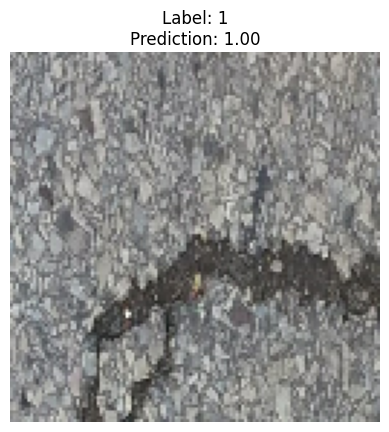

In [65]:
import random

def get_random_image():
    all_batches = list(test_ds.as_numpy_iterator())
    random_batch = random.choice(all_batches)
    random_index = random.randint(0, len(random_batch[0]) - 1)
    random_image = random_batch[0][random_index] # Image
    image_label = random_batch[1][random_index] # Label
    image_batch = tf.expand_dims(random_image, axis=0)
    return [random_image, image_batch, image_label]

random_image, image_batch, image_label = get_random_image()
predictions = model.predict(image_batch, verbose=0)
plt.imshow(random_image)
plt.title(f"Label: {random_label}\nPrediction: {predictions[0][0]:.2f}")
plt.axis("off")
plt.show()

Visualize the GradCAM heatmap

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


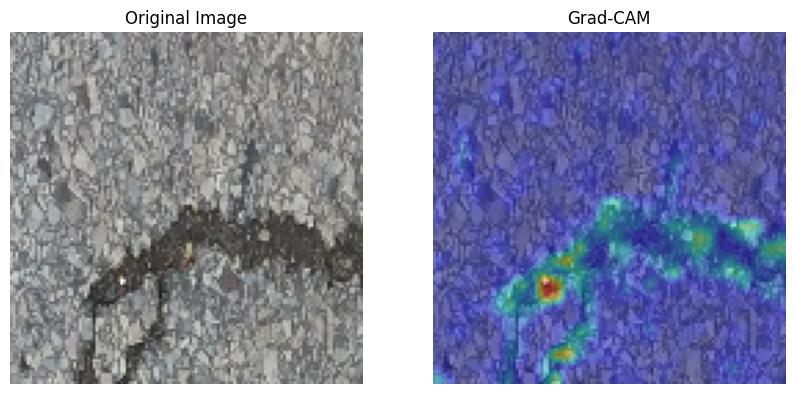

In [66]:
target_layer_name = model.layers[4].name # Last Conv2D layer in the model
last_layer_name = model.layers[-1].name
heatmap = gradcam_pipeline(model, random_image, target_layer_name, last_layer_name)

## Post-processing
Output of the GradCAM is easily interpretable for humans, because we know how cracks look. Yet, our task is to make such a model that would show the exact places where a road cracked, on its own. Post-processing of the obtained heatmap is necessary for that, and that's what we're going to do in the following steps. 

### Gaussian Blur
Gaussian blur is a simple modification that allows to "spread" high-value gradient to its neighbours. It is useful in case of very thin gradient lines - which is the case in road cracks. In other case, it is neither particularly useful, nor harmful, so it seems sensible to keep it.

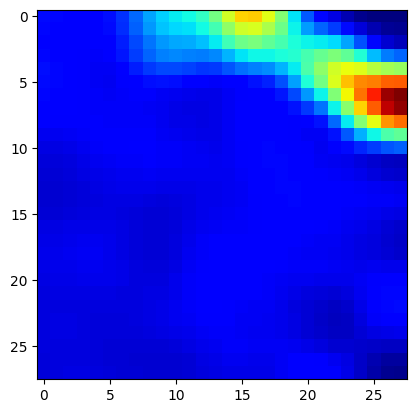

In [15]:
blured = cv2.GaussianBlur(heatmap,(5,5),5)
plt.imshow(blured, cmap='jet')

### Thresholding
An obvious idea that comes to mind when seeing the gradcam heatmaps is that it would be great if we could set a universal threshold on the percentile of value of heatmap - thus creating a binary mask of the relevant area (crack). Unfortunately, it is not that simple. Heatmaps vary significantly depending on example. Sometimes half the image is relevant in terms of heatmap, and sometimes only one dot got classified as important. Often it is the **relative** change that matters the most, i.e. pixels where weights are bigger than their neighbourhood, not the absolute value of weight. That's how the idea of using the **adaptive thresholding** emerged - by observing that a simple **binary threshold** is not sufficient.

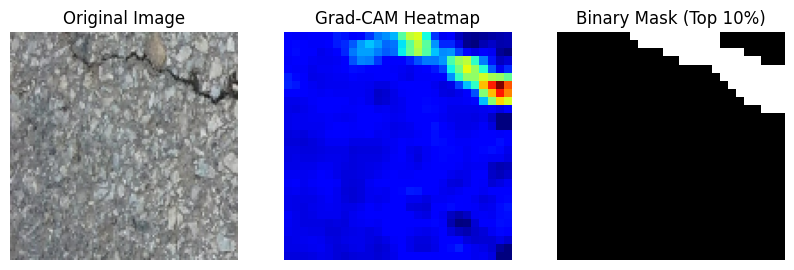

In [16]:
def apply_threshold(heatmap, percentile=95):
    flat_heatmap = heatmap.flatten()
    
    threshold = np.percentile(flat_heatmap, percentile)
    
    binary_mask = (heatmap >= threshold).astype(np.uint8)
    
    return binary_mask

binary_mask = apply_threshold(blured, percentile=90)
struct = np.ones([3, 3], np.uint8)
close = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, struct)

plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(random_image)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Grad-CAM Heatmap")
plt.imshow(heatmap, cmap="jet")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Binary Mask (Top 10%)")
plt.imshow(binary_mask, cmap="gray")
plt.axis("off")

plt.show()

###

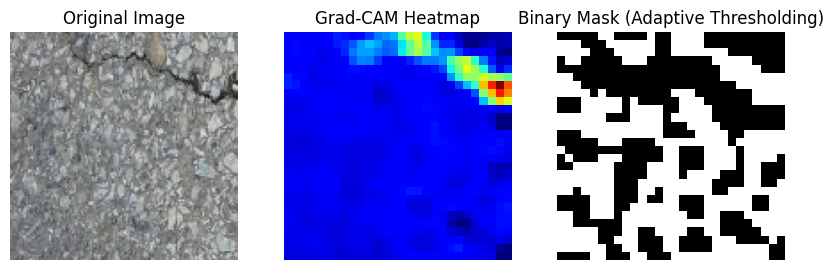

In [17]:
def apply_adaptive_threshold(heatmap, block_size=11, C=1):
    heatmap_8bit = np.uint8(heatmap * 255)

    binary_mask = cv2.adaptiveThreshold(
        heatmap_8bit,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        block_size,
        C
    )

    return binary_mask

ada_mask = apply_adaptive_threshold(heatmap)

plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(random_image)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Grad-CAM Heatmap")
plt.imshow(heatmap, cmap="jet")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Binary Mask (Adaptive Thresholding)")
plt.imshow(ada_mask, cmap="gray")
plt.axis("off")
plt.show()

Experiments shown that adaptive thresholding is not exactly what we're looking for, because of its tendency to select local maxima that are surrounded by low-weight neighbours, therefore being irrelevant to our prediction. When it comes to binary threshold, this method is too unsophisticated for our needs, as was explained before. However, the idea of adaptive thresholding didn't come for nothing - it sparked another idea that we will discuss later: namely, the GradCAM++.

### Morphological operations
Whenever working with binary images, it is worth considering morphological operations. The nature of heatmaps resulting of the gradcam algorithm is that often some segments are undesirably disconnected, while others are unwanted outliers that don't make up for cracks. Morphological **closing** seems like a perfect solution in this scenario.

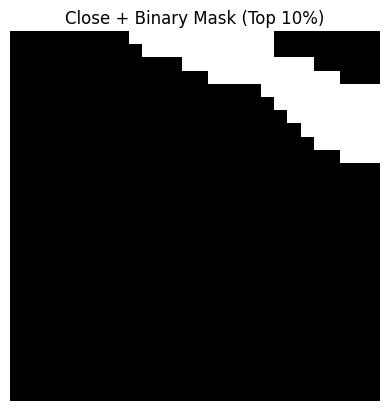

In [18]:
struct = np.ones([3, 3], np.uint8)
close = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, struct)

plt.title("Close + Binary Mask (Top 10%)")
plt.imshow(close, cmap="gray")
plt.axis("off")

plt.show()

### Skeletonization
Arguably the most important part of the post-processing. Skeletonization is crucial to obtain thin segments, shape that we expect from road cracks.

In [19]:
from scipy.ndimage import binary_hit_or_miss

def skeletonize(img):
    # img = ~img
    
    s1 = np.array([[-1, -1, -1], [0, 1, 0], [1, 1, 1]])
    s1_hit = np.where(s1 == 1, 1, 0)
    s1_miss = np.where(s1 == -1, 1, 0)
    
    s2 = np.array([[0, -1, -1], [1, 1, -1], [0, 1, 0]])
    s2_hit = np.where(s2 == 1, 1, 0)
    s2_miss = np.where(s2 == -1, 1, 0)
    
    img_copy = np.where(np.copy(img) == 1, 0, 1)
    steps = []
    while np.sum(img_copy != img):
        img_copy = np.copy(img)
        for _ in range(4):
            img = img & ~binary_hit_or_miss(img, s1_hit, s1_miss)
            s1_hit = np.rot90(s1_hit)
            s1_miss = np.rot90(s1_miss)
            img = img & ~binary_hit_or_miss(img, s2_hit, s2_miss)
            s2_hit = np.rot90(s2_hit)
            s2_miss = np.rot90(s2_miss)
            s2 = np.rot90(s2)
        steps.append(img)
    
    return img

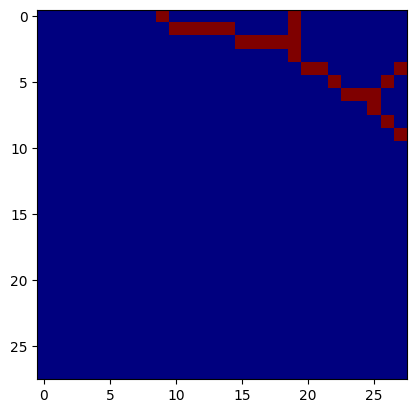

In [20]:
skeletonized = skeletonize(close)
plt.imshow(skeletonized, cmap='jet')

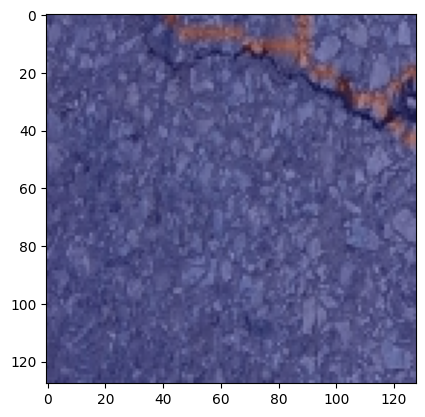

In [21]:
overlay = overlay_heatmap(random_image, skeletonized)
plt.imshow(overlay)

## GradCAM++
Grad-CAM++: Enhanced Gradient-Weighted Class Activation Mapping, [relevant paper](https://doi.org/10.48550/arXiv.1710.11063)

### Short description
Grad-CAM++ is an extension of the Grad-CAM algorithm that improves visual explanations for convolutional neural networks (CNNs). It was designed to address the limitations of Grad-CAM, particularly in handling images with:

- Multiple occurrences of the same class (e.g., multiple objects of the same type).
- Poor localization of objects in single-object images.

#### Key Enhancements in Grad-CAM++

**Pixel-wise Weighting of Gradients:**

Grad-CAM uses the average of gradients across spatial locations as weights for feature maps. Grad-CAM++ introduces pixel-wise weights to assign importance to each feature map pixel based on higher-order derivatives.
This approach enables better object localization by ensuring that all parts of the object are highlighted, not just the most dominant features.

**Higher-Order Gradients:**

Grad-CAM++ incorporates second-order (and third-order, but not in our implementation) derivatives of the class score with respect to feature maps. These derivatives help in accurately determining the contribution of each spatial pixel to the prediction.

**Closed-Form Solution:**

Grad-CAM++ provides a closed-form mathematical derivation for its pixel-wise weights, maintaining computational efficiency comparable to Grad-CAM.

**ReLU Activation:**

Similar to Grad-CAM, Grad-CAM++ applies a ReLU operation to the final saliency map to focus on positive contributions only. This emphasizes the areas that actively support the class prediction.

In [82]:
def make_gradcampp_heatmap(model, image, layer_name=None):
    image = tf.cast(image, tf.float32)
    if len(image.shape) == 3:
        image = tf.expand_dims(image, 0)
    
    # Get last conv layer if not specified
    if layer_name is None:
        for layer in reversed(model.layers):
            if isinstance(layer, tf.keras.layers.Conv2D):
                layer_name = layer.name
                break
    
    last_conv_layer = model.get_layer(layer_name)
    grad_model = tf.keras.Model(
        inputs=[model.input],
        outputs=[last_conv_layer.output, model.output]
    )
    
    with tf.GradientTape(persistent=True) as tape:
        tape.watch(image)
        conv_output, predictions = grad_model(image, training=False)
        class_channel = predictions
        
        grads = tape.gradient(class_channel, conv_output)
        if grads is None:
            raise ValueError("First-order gradients could not be computed")
            
        second_grads = tape.gradient(tf.reduce_sum(grads), conv_output)
        if second_grads is None:
            raise ValueError("Second-order gradients could not be computed")
            
    # Calculate alpha weights
    alpha_num = second_grads * conv_output
    alpha_denom = 2.0 * second_grads + tf.reduce_sum(
        second_grads * conv_output, axis=(1, 2), keepdims=True
    ) + 1e-8
    alpha_weights = alpha_num / alpha_denom
    
    # Weight the gradients
    weights = tf.reduce_sum(tf.maximum(grads, 0) * alpha_weights, axis=(1, 2))
    
    # Generate heatmap
    cam = tf.reduce_sum(weights * conv_output, axis=-1)
    cam = tf.maximum(cam, 0) / (tf.reduce_max(cam) + 1e-8)
    
    return cam.numpy()[0]

def overlay_heatmap(image, heatmap, alpha=0.4):
    # Resize heatmap to match image size
    heatmap = tf.image.resize(
        tf.expand_dims(tf.expand_dims(heatmap, -1), 0),
        (image.shape[0], image.shape[1])
    )
    heatmap = heatmap[0, ..., 0].numpy()
    
    # Convert heatmap to RGB
    cmap = plt.cm.jet
    heatmap_rgb = cmap(heatmap)[:, :, :3]
    
    overlaid = (1 - alpha) * image + alpha * heatmap_rgb
    overlaid = np.clip(overlaid, 0, 1)
    
    return overlaid

def visualize_gradcampp(model, image, layer_name=None):
    heatmap = make_gradcampp_heatmap(model, image, layer_name)
    
    if image.max() > 1:
        image = image / 255.0
        
    overlay = overlay_heatmap(image, heatmap)
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.axis("off")
    
    plt.subplot(1, 3, 2)
    plt.title("Heatmap")
    plt.imshow(heatmap, cmap='jet')
    plt.axis("off")
    
    plt.subplot(1, 3, 3)
    plt.title("Grad-CAM++ Overlay")
    plt.imshow(overlay)
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()

    return heatmap

Custom CNN that works with the GradCAM++ implementation

In [24]:
def create_classification_model(input_shape=(128, 128, 3)):
    inputs = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', name='conv1')(inputs)
    x = tf.keras.layers.MaxPooling2D((2, 2))(x)
    x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', name='conv2')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2))(x)
    x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', name='conv3')(x)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(64, activation='relu', name='dense1')(x)
    outputs = tf.keras.layers.Dense(1, activation='sigmoid', name='predictions')(x)
    
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam',
                 loss='binary_crossentropy',
                 metrics=['accuracy'])
    return model

In [50]:
model = create_classification_model()
model.summary()

history = model.fit(
    train_ds,
    validation_data=val_ds,
    class_weight = class_weights,
    epochs=10,
    verbose=0
)

predictions = model.predict(image_batch)
print(predictions)

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3 (Conv2D)                       │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense1 (Dense)                       │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ predictions (Dense)                  │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 101,569 (396.75 KB)

 Trainable params: 101,569 (396.75 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
481/481 ━━━━━━━━━━━━━━━━━━━━ 19s 35ms/step - accuracy: 0.7042 - loss: 1.0756 - val_accuracy: 0.9256 - val_loss: 0.2580
Epoch 2/20
481/481 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - accuracy: 0.8302 - loss: 0.8298 - val_accuracy: 0.9172 - val_loss: 0.2418
Epoch 3/20
481/481 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - accuracy: 0.8767 - loss: 0.7241 - val_accuracy: 0.8506 - val_loss: 0.4097
Epoch 4/20
481/481 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - accuracy: 0.8545 - loss: 0.7532 - val_accuracy: 0.8938 - val_loss: 0.3006
Epoch 5/20
481/481 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - accuracy: 0.8940 - loss: 0.6450 - val_accuracy: 0.9042 - val_loss: 0.2990
Epoch 6/20
481/481 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - accuracy: 0.8898 - loss: 0.6339 - val_accuracy: 0.8824 - val_loss: 0.2724
Epoch 7/20
481/481 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - accuracy: 0.8949 - loss: 0.5932 - val_accuracy: 0.9469 - val_loss: 0.1776
Epoch 8/20
481/481 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - accuracy: 0.9057 - loss: 0.5967 - 

In [198]:
def show_postprocessed_results_10_rows(model):
    plt.figure(figsize=(20, 40))
    
    for i in range(10):
        image, image_batch, image_label = get_random_image()
        heatmap = make_gradcampp_heatmap(model, image, layer_name=None)
        
        while image_label != 1 or heatmap.max() < 0.1:
            image, image_batch, image_label = get_random_image()
            heatmap = make_gradcampp_heatmap(model, image, layer_name=None)
        
        heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
        
        # Apply adaptive thresholding
        threshold_value = heatmap.mean() + heatmap.std()
        binary_mask = (heatmap > threshold_value).astype(np.uint8)
        
        struct = np.ones((3, 3), np.uint8)
        cleaned_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, struct)
        
        skeletonized = skeletonize(cleaned_mask)
        
        overlay = overlay_heatmap(image, skeletonized)
        
        row_start = i * 4 + 1
        plt.subplot(10, 4, row_start)
        plt.title(f"Original Image {i+1}")
        plt.imshow(image)
        plt.axis("off")
        
        plt.subplot(10, 4, row_start + 1)
        plt.title(f"Heatmap {i+1}")
        plt.imshow(heatmap, cmap='jet')
        plt.axis("off")
        
        plt.subplot(10, 4, row_start + 2)
        plt.title(f"Final Mask {i+1}")
        plt.imshow(skeletonized)
        plt.axis("off")
        
        plt.subplot(10, 4, row_start + 3)
        plt.title(f"Final Overlay {i+1}")
        plt.imshow(overlay)
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()


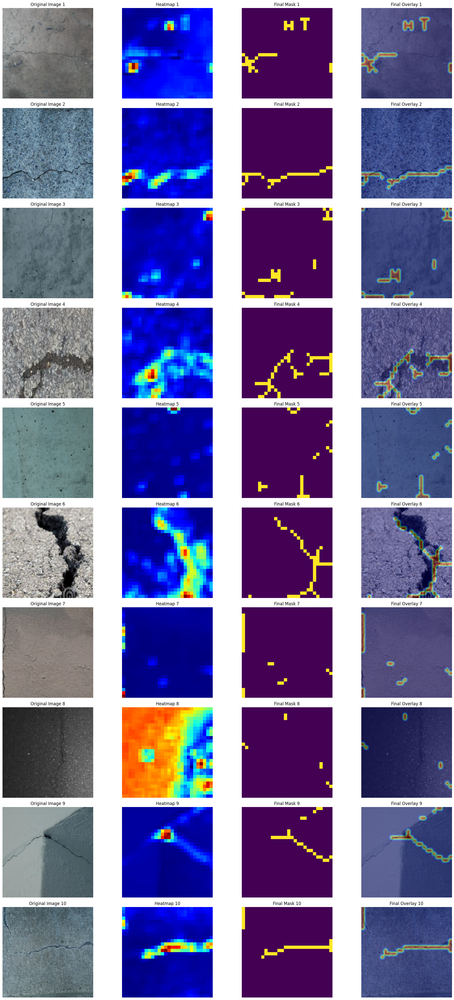

In [199]:
show_postprocessed_results_10_rows(model)

### Drawbacks of the approach

1. **Vanishing gradient**

As you can see in the picture below, our model sometimes may have problems with displaying heatmaps of atypical images. It seems that this issue is due to the **vanishing gradient** effect. 

How does this affect the GradCAM++ algorithm?

- Weakened First-Order Gradients (most likely the case here): 

Grad-CAM++ uses first-, second-, and third-order gradients to calculate pixel-wise importance weights. If the gradients are too small, the computed weights (alpha_weights) may become negligible, resulting in heatmaps with little to no activation (e.g., all-black heatmaps).

- Reduced Sensitivity in Deeper Layers:

In very deep networks, vanishing gradients can cause Grad-CAM++ to fail at capturing meaningful activations in deeper layers, as the contributions from those layers diminish. This was the issue when trying to extract heatmaps from ResNet which has plenty of layers.

- Noise Amplification in Higher-Order Gradients:

When gradients are already weak, the computation of second- and third-order gradients can amplify numerical instability or noise, further degrading the quality of the heatmap.

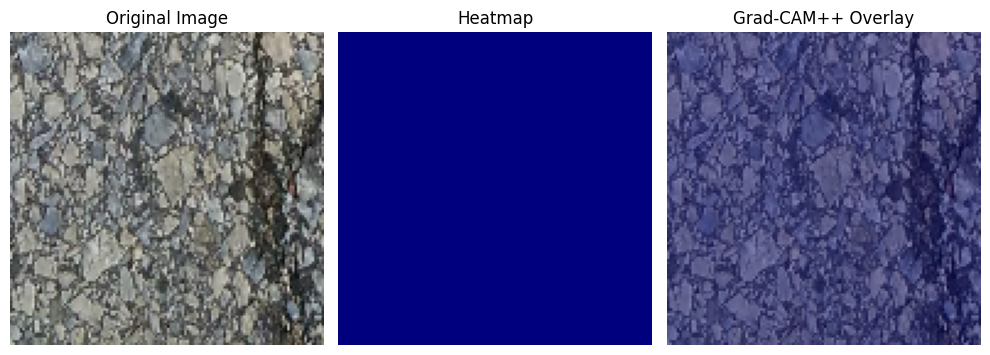

0.0 0.0


In [170]:
random_image, image_batch, image_label = get_random_image()

heatmap_gradcampp = visualize_gradcampp(model, random_image, layer_name=None)
print(heatmap_gradcampp.mean(), heatmap_gradcampp.max())

2. **Higher Computational Cost**

- Grad-CAM++ involves the computation of second- and third-order gradients, which increases computational complexity compared to Grad-CAM.
- May be slower on large models or datasets.

3. **Susceptibility to Noise**

- The reliance on higher-order gradients can make Grad-CAM++ sensitive to small variations in the feature maps or class scores, leading to noisy heatmaps in some cases.

4. **Potential Overemphasis**

- The method can sometimes over-highlight regions due to pixel-wise weighting, potentially attributing importance to irrelevant areas if the higher-order gradients are misleading.

## UP-CrackNet

Unsupervised Pixel-Wise Road Crack Detection via Adversarial Image Restoration, [relevant paper](https://doi.org/10.48550/arXiv.2401.15647).

### Our contribution
While most of the code used for this method we took from [authors' github](https://github.com/NaChuaN666/UP-CrackNet/tree/main/ck_mask), we've put some effort into it.

Our contribution comprises:
- Dataset preprocessing, to take fragments without cracks, 
- Adjusting the path structure,
- Testing of different architectures parameters,
- Changing the resultant grayscale images into binary masks (to compare them with our dataset's format)

### Summary of UP-CrackNet
UP-CrackNet is an unsupervised pixel-wise road crack detection framework leveraging adversarial image restoration. Unlike supervised approaches requiring extensive annotated datasets, UP-CrackNet trains only on undamaged road images to perform crack detection. The methodology comprises the following steps:

1. Random Corruption of Images:

    Undamaged road images are corrupted using randomly generated multi-scale square masks to simulate missing regions.

2. Adversarial Image Restoration:

    A generator-discriminator architecture (GAN) restores corrupted regions based on semantic information from surrounding uncorrupted areas.
    The generator utilizes a U-Net backbone, combining convolutional and deconvolutional operations with BatchNorm, Dropout, and LeakyReLU to ensure robust feature learning.
    The discriminator distinguishes between real and restored images to guide realistic restoration.

3. Testing Phase:

    For a given damaged image, restoration is performed. The difference between the input and the restored image creates an error map highlighting areas the model fails to restore, corresponding to cracks.
    Post-processing (bilateral filtering and Otsu’s thresholding) refines the error map into a crack detection mask.

4. Loss Functions:

    The framework uses a combination of restoration loss (MAE, SSIM, and MSGMS) and adversarial loss to balance pixel accuracy and structural fidelity.



Generate masks from the testset

In [ ]:
!python3 test.py

Function to display 10 random images from the dataset

In [30]:
import os
from PIL import Image

def display_image_comparison():
    mask_dir = './results/masks'
    mask_files = [f for f in os.listdir(mask_dir) if f.endswith('.png')]
    selected_masks = random.sample(mask_files, 10)
    
    fig, axes = plt.subplots(10, 3, figsize=(15, 30))
    
    axes[0, 0].set_title('Original Image')
    axes[0, 1].set_title('Dataset Mask')
    axes[0, 2].set_title('Result Mask')
    
    for idx, mask_file in enumerate(selected_masks):
        base_name = mask_file.rsplit('.', 1)[0]
        
        orig_path = os.path.join('./dataset/test/images', f"{base_name}.jpg")
        orig_img = Image.open(orig_path)
        
        dataset_mask_path = os.path.join('./dataset/test/masks', f"{base_name}.jpg")
        dataset_mask = Image.open(dataset_mask_path)
        
        result_mask_path = os.path.join('./results/masks', f"{base_name}.png")
        result_mask = Image.open(result_mask_path)
        
        axes[idx, 0].imshow(orig_img)
        axes[idx, 1].imshow(dataset_mask, cmap='gray')
        axes[idx, 2].imshow(result_mask, cmap='gray')
        
        for ax in axes[idx]:
            ax.set_xticks([])
            ax.set_yticks([])
    
    plt.tight_layout()
    plt.show()

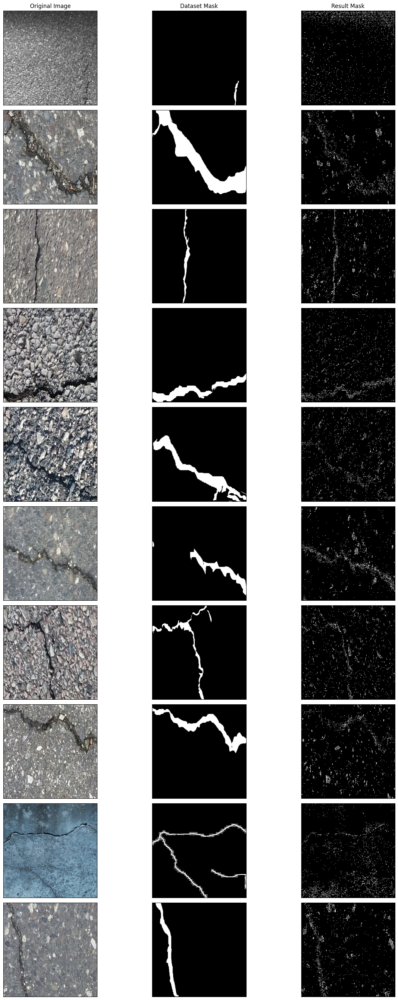

In [32]:
display_image_comparison()